In [475]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
import math

In [476]:
def show_img(img):
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

In [477]:
def show_img_axis(img):
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.show()

In [478]:
def show_img_zoom(img, x=100, y=150, w=200, h=200, output_path=""):
    roi = img[y:y+h, x:x+w]
    zoomed = cv.resize(roi, (img.shape[1], img.shape[0]), interpolation=cv.INTER_CUBIC)
    plt.figure(figsize=(10, 6))
    plt.imshow(zoomed)
    plt.axis("off")
    plt.savefig(output_path)
    plt.show()

In [479]:
def save_img(img, output_path):
    cv.imwrite(output_path, img)

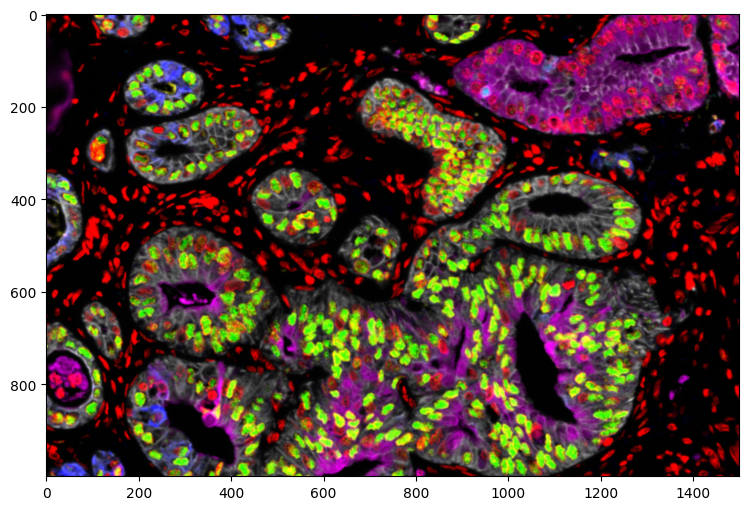

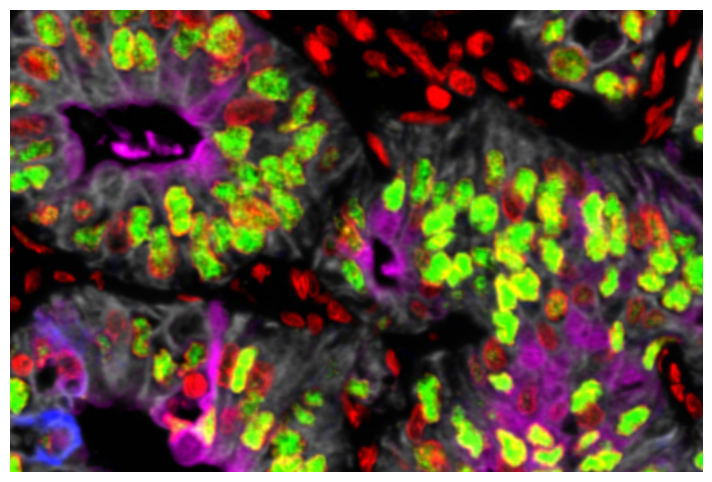

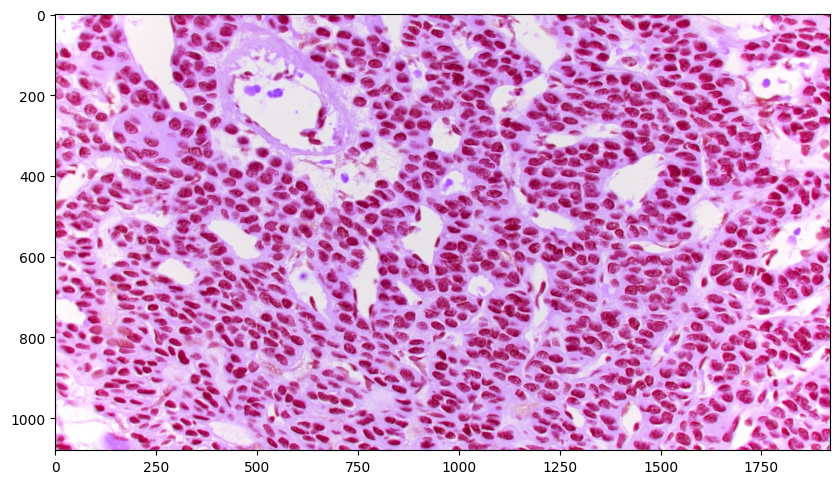

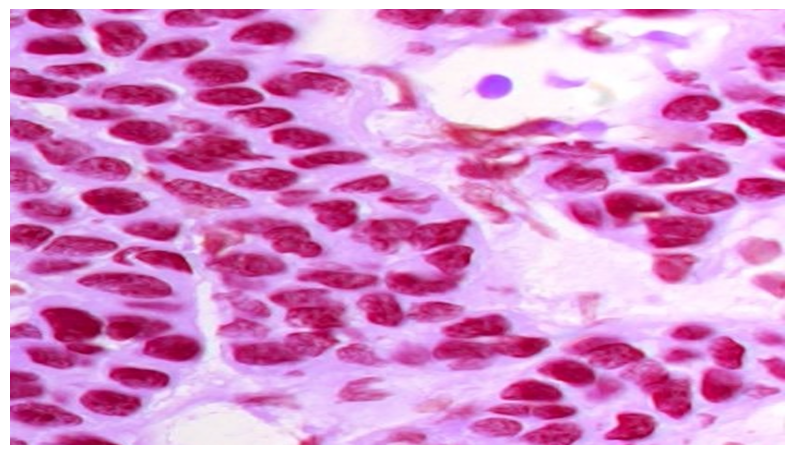

In [480]:
cancer_img = cv.imread("images/CancerCells-1.jpg", cv.IMREAD_COLOR)
kidney_img = cv.imread("images/kidneytumorglomus.jpg", cv.IMREAD_COLOR)
show_img_axis(cancer_img)
show_img_zoom(cancer_img, 200, 500, 600, 400, "images/cancer_zoom.png")
show_img_axis(kidney_img)
show_img_zoom(kidney_img, 1500, 100, 600, 400, "images/kidney_zoom.png")
cancer_gray_img = cv.imread("images/CancerCells-1.jpg", cv.IMREAD_GRAYSCALE)
kidney_gray_img = cv.imread("images/kidneytumorglomus.jpg", cv.IMREAD_GRAYSCALE)

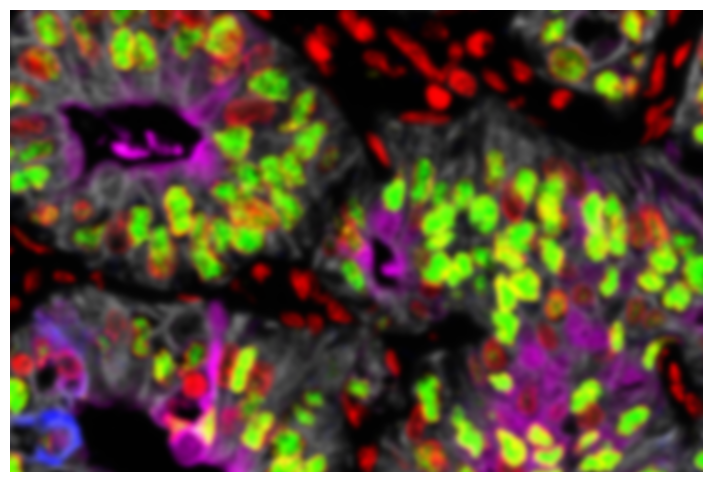

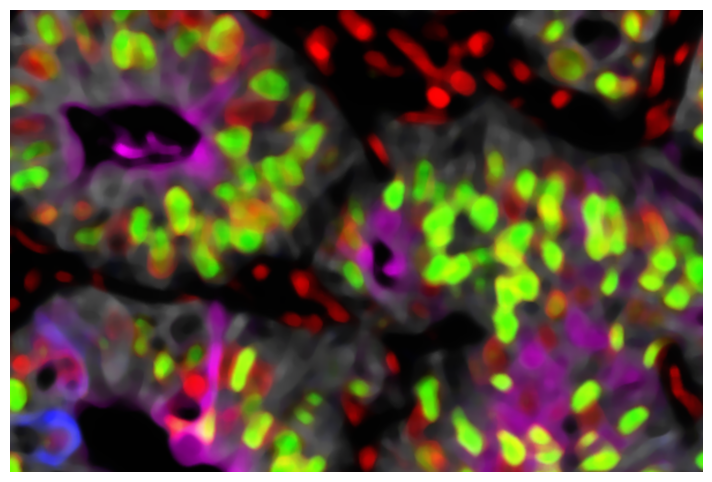

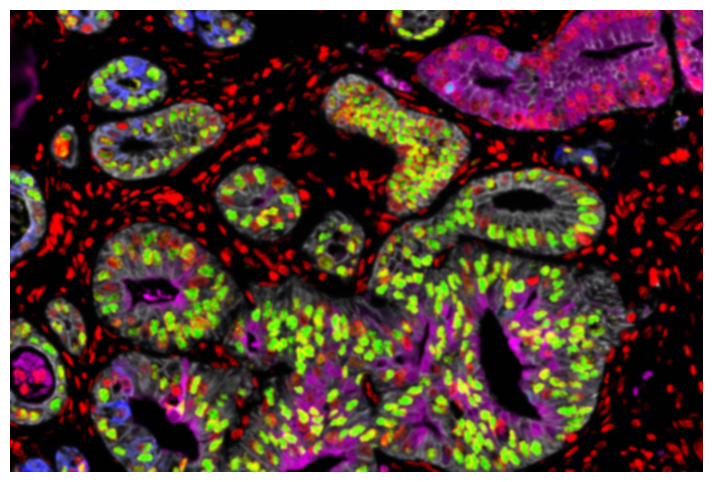

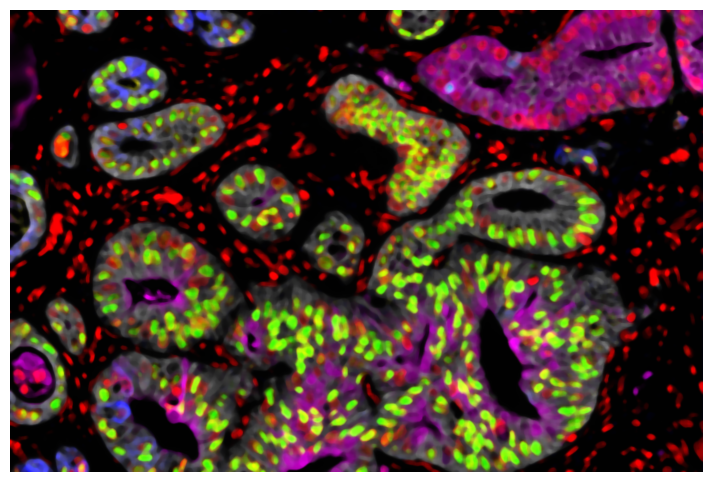

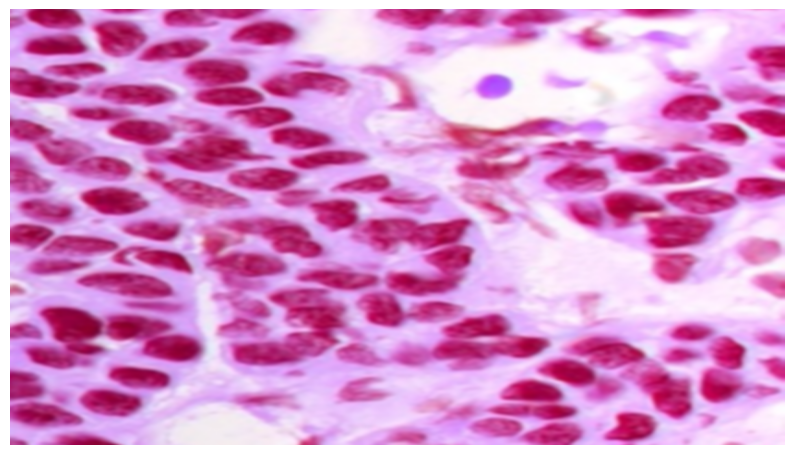

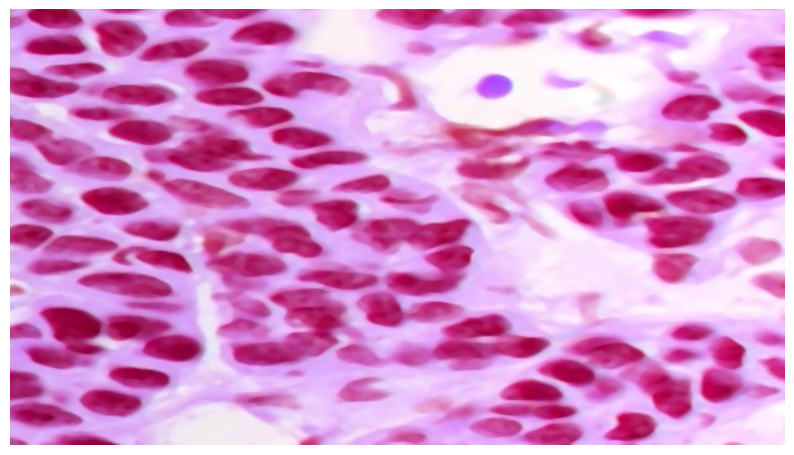

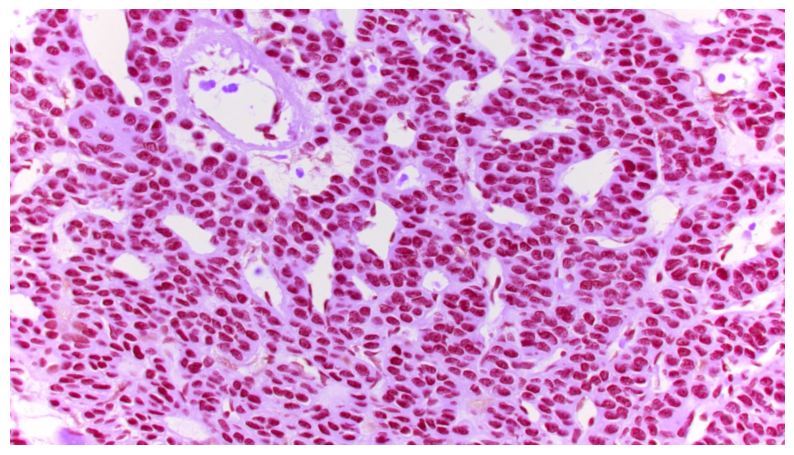

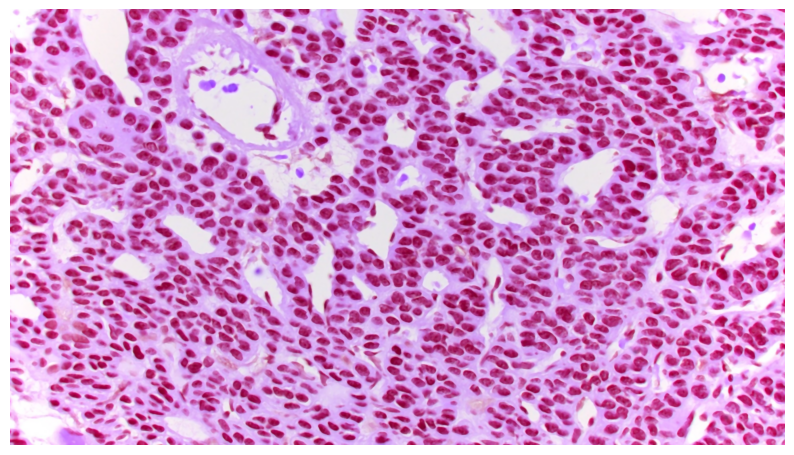

In [481]:
cancer_gaussian = cv.GaussianBlur(cancer_img, (11,11), 0)
cancer_median = cv.medianBlur(cancer_img, 11)
save_img(cancer_gaussian, "images/cancer_gaussian.png")
show_img_zoom(cancer_gaussian, 200, 500, 600, 400, "images/cancer_gaussian_zoom.png")
save_img(cancer_median, "images/cancer_median.png")
show_img_zoom(cancer_median, 200, 500, 600, 400, "images/cancer_median_zoom.png")
show_img(cancer_gaussian)
show_img(cancer_median)

kidney_gaussian = cv.GaussianBlur(kidney_img, (5,5), 0)
kidney_median = cv.medianBlur(kidney_img, 5)
save_img(kidney_gaussian, "images/kidney_gaussian.png")
show_img_zoom(kidney_gaussian, 1500, 100, 600, 400, "images/kidney_gaussian_zoom.png")
save_img(kidney_median, "images/kidney_median.png")
show_img_zoom(kidney_median, 1500, 100, 600, 400, "images/kidney_median_zoom.png")
show_img(kidney_gaussian)
show_img(kidney_median)

In [482]:
def rgb2chan(img, channel):
    chan = img[:, :, channel]
    return chan

In [483]:
def LoG(x=0, y=0, sigma=1.0):
    r2 = x**2 + y**2
    coeff = 1 / (math.pi * sigma**4)
    term = 1 - (r2 / (2 * sigma**2))
    exponent = math.exp(-r2 / (2 * sigma**2))
    return coeff * term * exponent

In [495]:
def LoG_kernel(size=5, sigma=1.0):
    half = size // 2 # create a -1n 1n box
    kernel = []
    for y in range(-half, half + 1):
        row = []
        for x in range(-half, half + 1):
            row.append(LoG(x, y, sigma))
        kernel.append(row)
    kernel -= np.mean(kernel) # normalize
    return kernel

In [514]:
def LoG_output(img, sigma=2.0):
    size = int(sigma)
    log_kernel = LoG_kernel(size, sigma)
    log_response = cv.filter2D(img.astype(np.float32), cv.CV_32F, log_kernel)
    return log_response

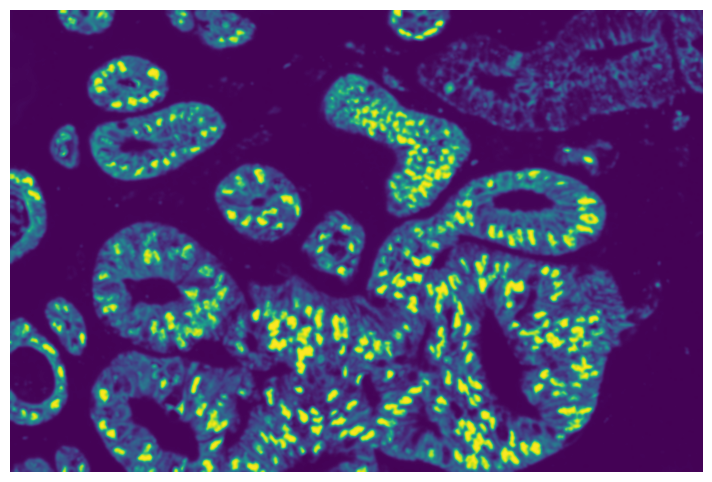

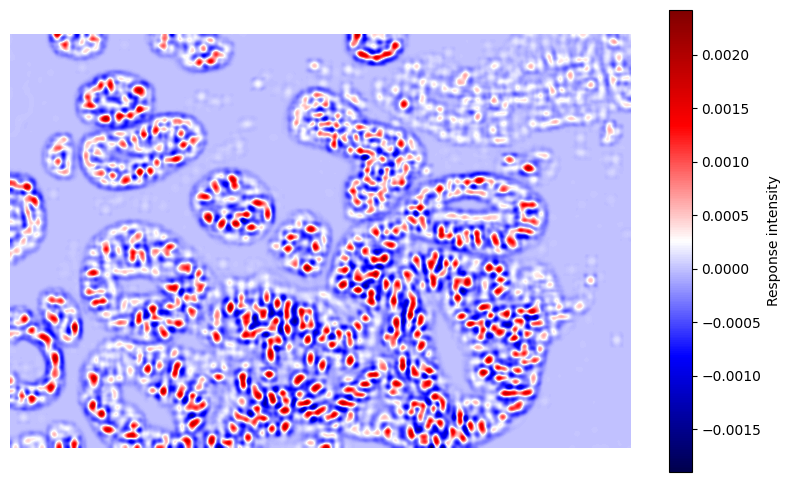

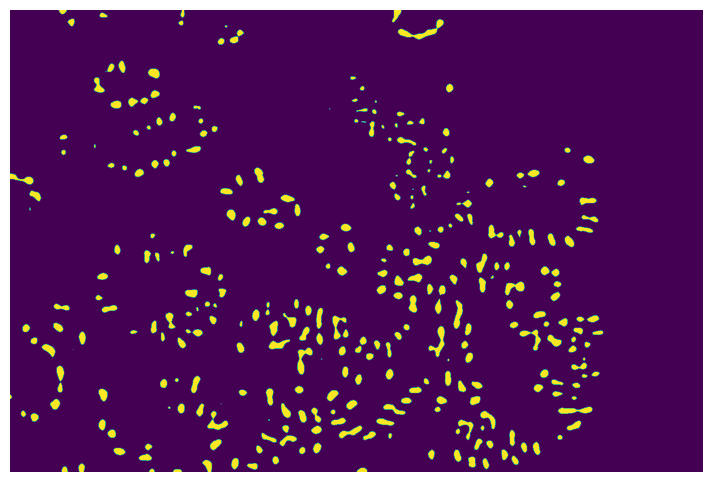

In [525]:
sigma = 29.0
LoG_threshold = 0.00075

cancer_ggray_img = rgb2chan(cancer_gaussian, 1)
log_result = LoG_output(cancer_ggray_img, sigma=sigma)
binary_mask = (log_result > LoG_threshold).astype(np.uint8)

plt.figure(figsize=(10, 6))
plt.axis('off')
plt.imshow(cancer_ggray_img)
plt.savefig("images/cancer_ggray.png")
plt.show()

plt.figure(figsize=(10, 6))
plt.axis('off')
plt.imshow(log_result, cmap='seismic')
plt.colorbar(label='Response intensity')
plt.savefig("images/cancer_LoG.png")
plt.show()

plt.figure(figsize=(10, 6))
plt.axis('off')
plt.imshow(binary_mask)
plt.savefig("images/cancer_binary.png")
plt.show()


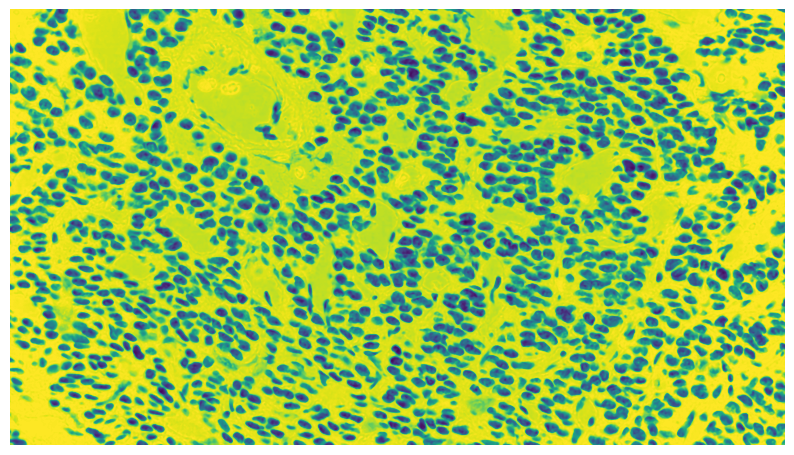

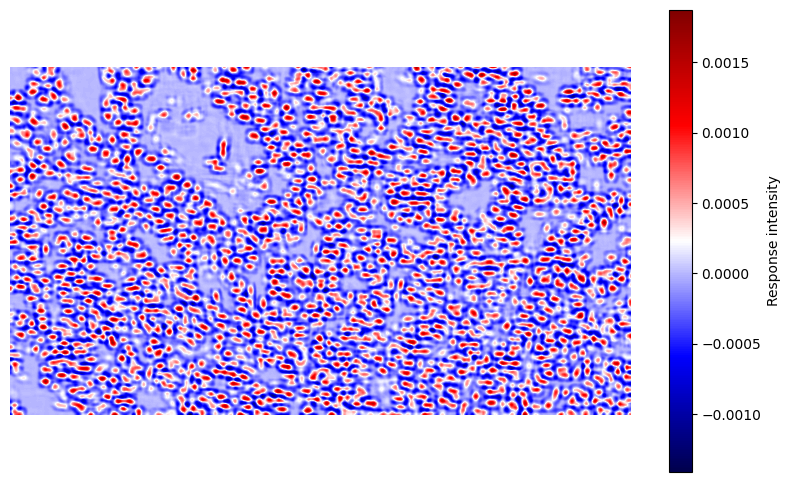

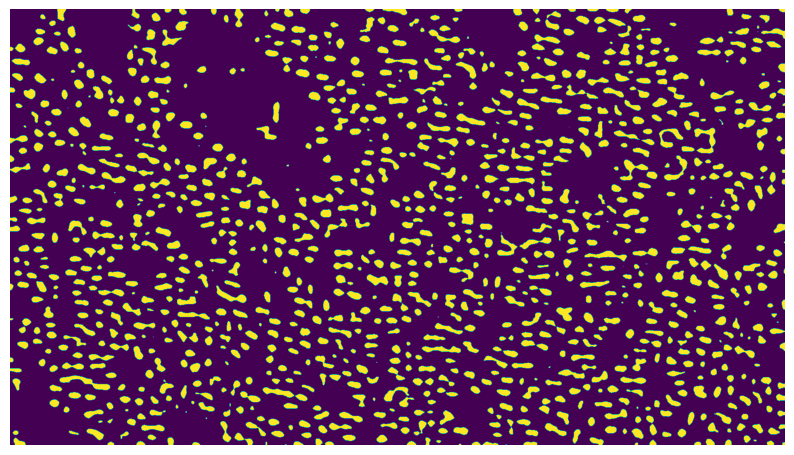

In [529]:
sigma = 31.0
LoG_threshold = 0.0004

kidney_rgray_img = rgb2chan(kidney_median, 2)
kidney_inverse = cv.bitwise_not(kidney_rgray_img)
save_img(kidney_inverse, "images/kidney_inverse.png")
log_result = LoG_output(kidney_inverse, sigma=sigma)
binary_mask = (log_result > LoG_threshold).astype(np.uint8)

plt.figure(figsize=(10, 6))
plt.axis('off')
plt.imshow(kidney_ggray_img)
plt.savefig("images/kidney_rgray.png")
plt.show()

plt.figure(figsize=(10, 6))
plt.axis('off')
plt.imshow(log_result, cmap='seismic')
plt.colorbar(label='Response intensity')
plt.savefig("images/kidney_LoG.png")
plt.show()

plt.figure(figsize=(10, 6))
plt.axis('off')
plt.imshow(binary_mask)
plt.savefig("images/kidney_binary.png")
plt.show()


In [496]:
def kmeans(img, output_image_path, number_of_clusters, max_iterations):
    rows, cols = img.shape
    pixels = img.reshape(-1, 1).astype(np.float32) # flatten and convert to floats
    kmeans = KMeans(n_clusters=number_of_clusters, max_iter=max_iterations, verbose=1, n_init=1)
    labels = kmeans.fit_predict(pixels) # assign pixels to clusters
    segmented = kmeans.cluster_centers_[labels].astype(np.uint8) # convert pixels to the mean of each cluster
    output = segmented.reshape(rows, cols).astype(np.uint8) # unflatten and convert to integers
    show_img(output)
    cv.imwrite(output_image_path, output)
    return output

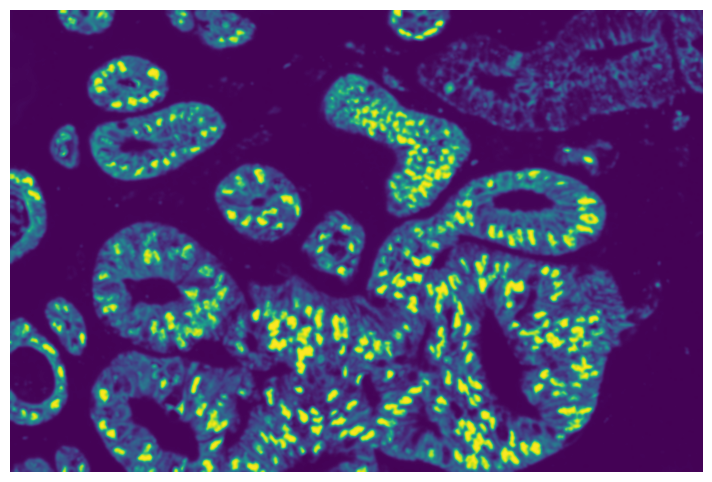

Initialization complete
Iteration 0, inertia 479876960.0.
Iteration 1, inertia 322648576.0.
Iteration 2, inertia 302376064.0.
Iteration 3, inertia 299267392.0.
Iteration 4, inertia 298693696.0.
Iteration 5, inertia 298592672.0.
Iteration 6, inertia 298557888.0.
Converged at iteration 6: strict convergence.


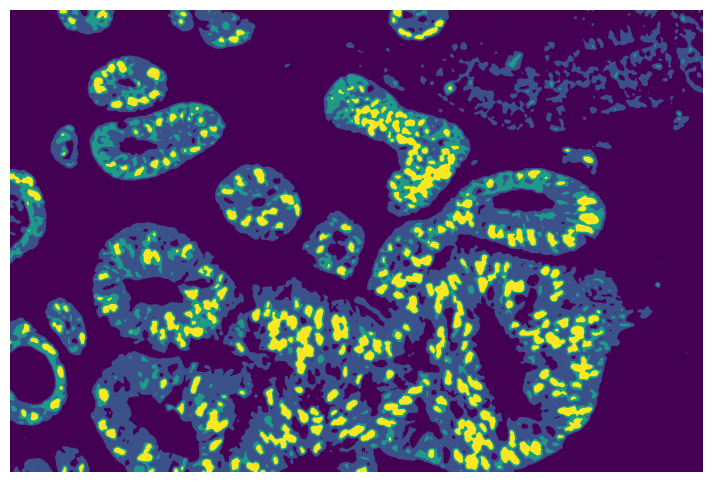

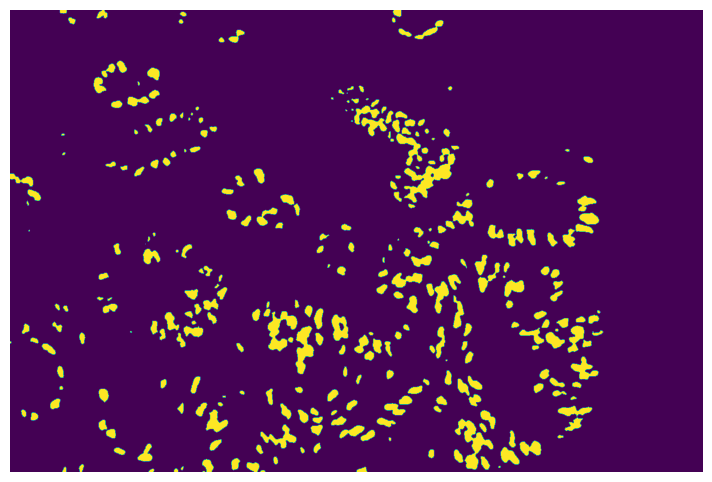

In [489]:
clusters = 4
iterations = 100 # large number just wait until convergence
kmeans_thresh_lower = 200

cancer_ggray_img = rgb2chan(cancer_gaussian, 1)
show_img(cancer_ggray_img)
cancer_kmeans = kmeans(cancer_ggray_img, "images/cancer_kmeans.png", clusters, iterations)
_, cancer_kmeans_binary = cv.threshold(cancer_kmeans, kmeans_thresh_lower, 255, cv.THRESH_BINARY)
show_img(cancer_kmeans_binary)
save_img(cancer_kmeans_binary, "images/cancer_kmeans_binary.png")

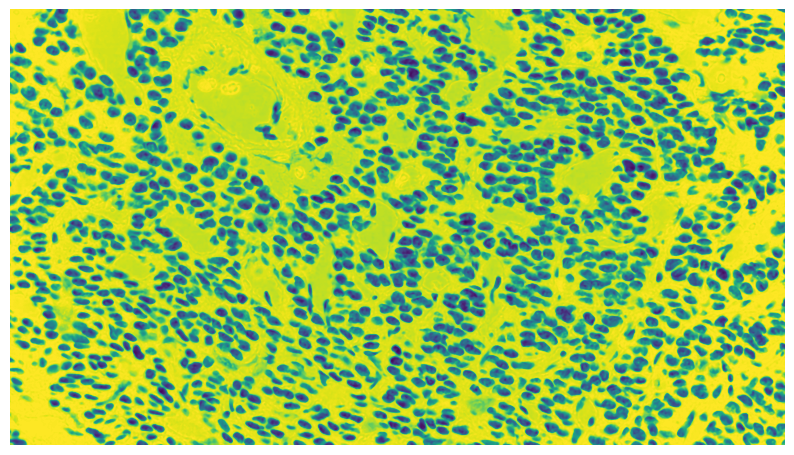

Initialization complete
Iteration 0, inertia 444078848.0.
Iteration 1, inertia 296589568.0.
Iteration 2, inertia 293135040.0.
Iteration 3, inertia 292270848.0.
Iteration 4, inertia 291611328.0.
Iteration 5, inertia 291053184.0.
Iteration 6, inertia 290913152.0.
Converged at iteration 6: strict convergence.


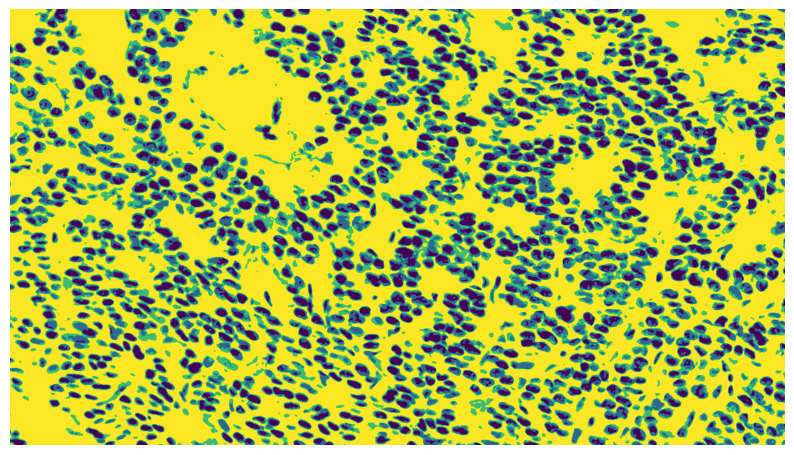

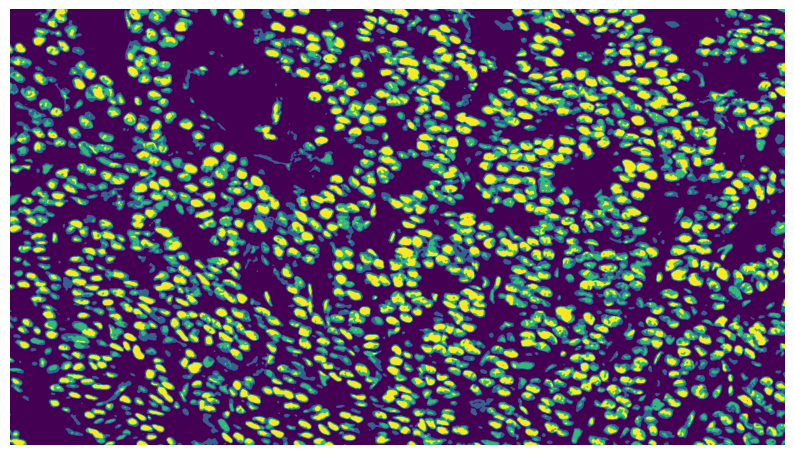

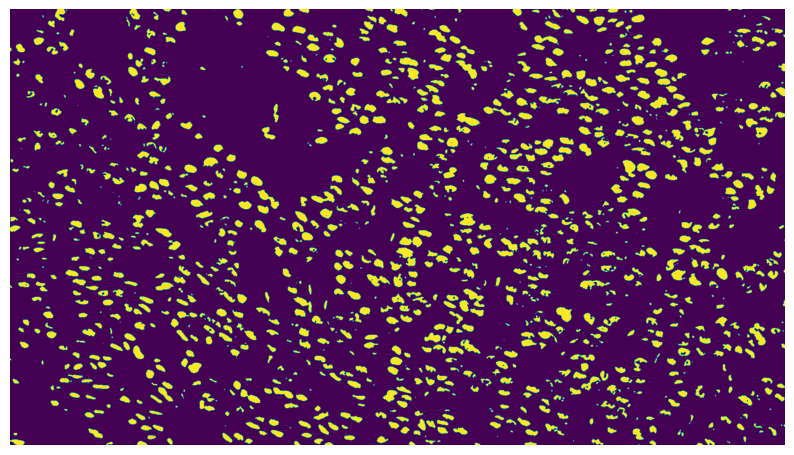

In [490]:
clusters = 4
iterations = 100 # large number just wait until convergence
kmeans_thresh_lower = 150

kidney_rgray_img = rgb2chan(kidney_median, 2)
show_img(kidney_rgray_img)
kidney_kmeans = kmeans(kidney_rgray_img, "images/kidney_kmeans.png", clusters, iterations)
kidney_kmeans_inverse = cv.bitwise_not(kidney_kmeans)
show_img(kidney_kmeans_inverse)
_, kidney_kmeans_binary = cv.threshold(kidney_kmeans_inverse, kmeans_thresh_lower, 255, cv.THRESH_BINARY)

show_img(kidney_kmeans_binary)
save_img(kidney_kmeans_binary, "images/kidney_kmeans_binary.png")